In [449]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio
import random
cv2.ocl.setUseOpenCL(False)
import warnings
warnings.filterwarnings("ignore")


# loading the images 

In [450]:
# === STEP 1: Load and Preprocess Images ===
train_img = cv2.imread(r'C:\Users\ronjd\OneDrive\Desktop\project public repo\image stitching\unstitched\train.jpg')
train_img = cv2.cvtColor(train_img, cv2.COLOR_BGR2RGB)
train_gray = cv2.cvtColor(train_img, cv2.COLOR_RGB2GRAY)



In [451]:
query_img = cv2.imread(r'C:\Users\ronjd\OneDrive\Desktop\project public repo\image stitching\unstitched\query.jpg')
query_img = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB)
query_gray = cv2.cvtColor(query_img, cv2.COLOR_RGB2GRAY)

Text(0.5, 0, 'Train Image')

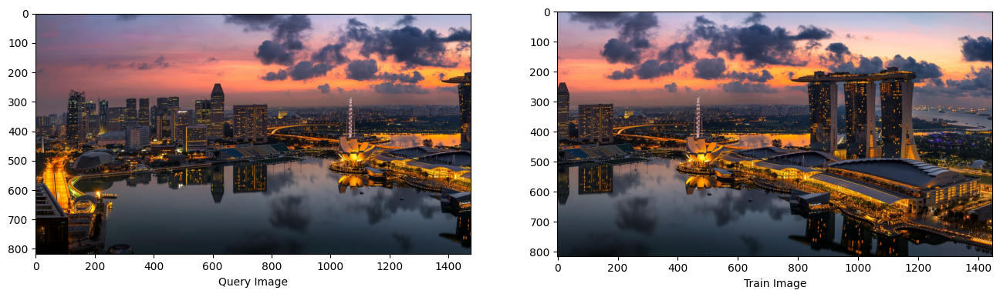

In [452]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 9))
ax1.imshow(query_img)
ax1.set_xlabel('Query Image')
ax2.imshow(train_img)
ax2.set_xlabel('Train Image')

# preprocessing

In [453]:
#harris corner detection 
def detect_harris_keypoints(gray_img, block_size=2, ksize=3, k=0.04, threshold_ratio=0.01):
    harris_response = cv2.cornerHarris(gray_img, block_size, ksize, k)
    harris_response = cv2.dilate(harris_response, None)
    threshold = threshold_ratio * harris_response.max()
    coords = np.argwhere(harris_response > threshold)
    keypoints = [cv2.KeyPoint(float(x), float(y), 3) for y, x in coords]
    return keypoints


In [454]:
# SIFT Descriptor Extraction at Harris Keypoints 
sift = cv2.SIFT_create()
query_kp = detect_harris_keypoints(query_gray)
train_kp = detect_harris_keypoints(train_gray)
query_kp, query_desc = sift.compute(query_gray, query_kp)
train_kp, train_desc = sift.compute(train_gray, train_kp)

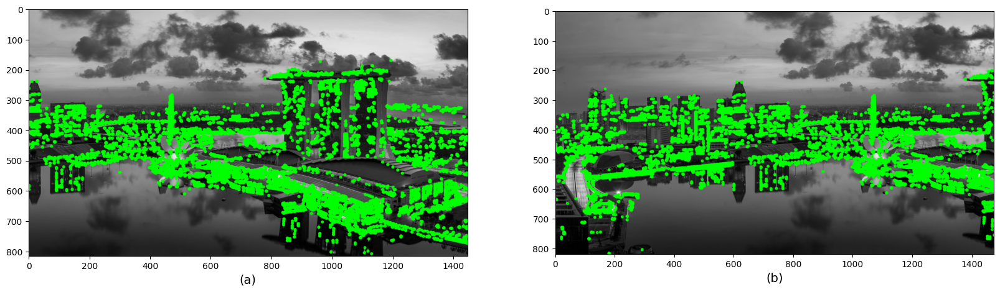

In [455]:
fig, (ax1, ax2) = plt.subplots(1, 2, constrained_layout = False, figsize=(20, 8))
ax1.imshow(cv2.drawKeypoints(train_gray,    train_kp, None, color=(0, 255, 0)))
ax1.set_xlabel('(a)', fontsize=14)
ax2.imshow(cv2.drawKeypoints(query_gray, query_kp, None, color=(0, 255, 0)))
ax2.set_xlabel('(b)', fontsize=14)

plt.show()

# Custom RANSAC With Affine Transform

In [456]:
# Custom RANSAC for Affine Transformation
def custom_ransac_affine(matches, kp1, kp2, threshold=3.0, iterations=300, seed=None):
     if seed is not None:
        random.seed(seed)
     best_inliers = []
     best_residuals = []
     best_M = None
     for _ in range(iterations):
        subset = random.sample(matches, 3)
        src_pts = np.float32([kp2[m.trainIdx].pt for m in subset]).reshape(-1, 2)
        dst_pts = np.float32([kp1[m.queryIdx].pt for m in subset]).reshape(-1, 2)
        M = cv2.getAffineTransform(src_pts, dst_pts)

        inliers = []
        residuals = [] 
        for m in matches:
            pt_train = np.array(kp2[m.trainIdx].pt + (1,))
            predicted = np.dot(M, pt_train)
            actual = np.array(kp1[m.queryIdx].pt)
            error = np.linalg.norm(predicted - actual)
            if error < threshold:
                inliers.append(m)
                residuals.append(error)

        if len(inliers) > len(best_inliers):
            best_inliers = inliers
            best_M = M
            best_residuals = residuals

     return best_M, best_inliers, best_residuals



# matching the key points and stitching the images


In [457]:
# Distance Metrics 
def normalize_descriptors(desc):
    norms = np.linalg.norm(desc, axis=1, keepdims=True)
    return desc / (norms + 1e-8)

normalized_query = normalize_descriptors(query_desc)
normalized_train = normalize_descriptors(train_desc)


In [458]:
# Sample descriptors to speed up computation
query_sample_indices = np.random.choice(len(normalized_query), size=min(500, len(normalized_query)), replace=False)
train_sample_indices = np.random.choice(len(normalized_train), size=min(500, len(normalized_train)), replace=False)

## Threshold of 0.3

filtering the keypoints that have strong matches that are below 0.3 

In [459]:
#compute the euclidian distnce
matches = []
for i in query_sample_indices:
    dists = np.linalg.norm(normalized_train[train_sample_indices] - normalized_query[i], axis=1)
    best_j_local = np.argmin(dists)
    best_dist = dists[best_j_local]
    best_j = train_sample_indices[best_j_local]
    if best_dist < 0.3:  # Filter for strong matches only
        matches.append(cv2.DMatch(_queryIdx=i, _trainIdx=best_j, _distance=best_dist))


In [460]:
matches = sorted(matches, key=lambda x: x.distance)

matches = matches[:100]
print("total number of matches:", len(matches))

total number of matches: 8


In [461]:
M_affine, inlier_matches,residuals = custom_ransac_affine(matches, query_kp, train_kp,seed=42)
print("Inliers:", len(inlier_matches))
print("Outliers:", len(matches) - len(inlier_matches))
avg_squared_residual = np.mean(np.square(residuals))
rmse = np.sqrt(np.mean(np.square(residuals)))
avg_residual = np.mean(residuals)
print("Average residual:", avg_residual)
print("RMSE:", rmse)
print("Average squared residual:", avg_squared_residual)
print("Best Affine Matrix (best_M):\n", M_affine)

Inliers: 8
Outliers: 0
Average residual: 0.8943946357091972
RMSE: 1.1610881726611002
Average squared residual: 1.3481257446934927
Best Affine Matrix (best_M):
 [[9.96488588e-01 8.54339102e-03 5.97108383e+02]
 [3.51141209e-03 9.91456609e-01 4.89161650e+00]]


In [462]:
# Accuracy Score (Euclidean Distance) 
def compute_accuracy_score(matches, kp1, kp2, M):
    errors = []
    for m in matches:
        pt_train = np.array(kp2[m.trainIdx].pt + (1,))
        projected = np.dot(M, pt_train)
        target = np.array(kp1[m.queryIdx].pt)
        error = np.linalg.norm(projected - target)
        errors.append(error)
    return np.mean(errors)

accuracy_score = compute_accuracy_score(inlier_matches, query_kp, train_kp, M_affine)
print(f"Accuracy Score (Avg Euclidean Distance): {accuracy_score:.2f} pixels")

Accuracy Score (Avg Euclidean Distance): 0.89 pixels


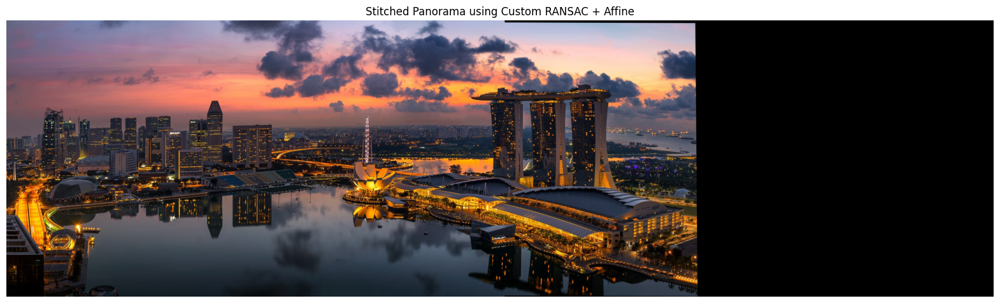

In [463]:
height, width = query_img.shape[:2]
warped_img = cv2.warpAffine(train_img, M_affine, (width + train_img.shape[1], height))
warped_img[0:height, 0:width] = query_img

plt.figure(figsize=(20, 8))
plt.imshow(warped_img)
plt.axis('off')
plt.title("Stitched Panorama using Custom RANSAC + Affine")
plt.show()



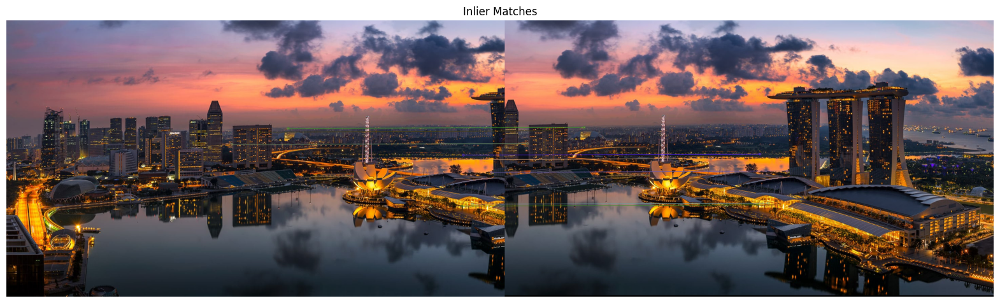

In [464]:
#  Inlier Matches plots
inlier_vis = cv2.drawMatches(query_img, query_kp, train_img, train_kp, inlier_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(20, 8))
plt.imshow(inlier_vis)
plt.axis('off')
plt.title("Inlier Matches")
plt.show()

In [465]:
iterations = [100, 300, 500, 1000, 1500]
avg_residuals = []
for i in iterations:
    M, inliers, residuals = custom_ransac_affine(matches, query_kp, train_kp, threshold=3.0, iterations=i, seed=42)
    avg_residuals.append(np.mean(residuals))
    print(f"Iterations: {i}, Inliers: {len(inliers)}, Avg Residual: {np.mean(residuals):.2f}")
    


Iterations: 100, Inliers: 8, Avg Residual: 0.89
Iterations: 300, Inliers: 8, Avg Residual: 0.89
Iterations: 500, Inliers: 8, Avg Residual: 0.89
Iterations: 1000, Inliers: 8, Avg Residual: 0.89
Iterations: 1500, Inliers: 8, Avg Residual: 0.89


## Threshold of 0.5

In [466]:
#compute the euclidian distnce
matches2 = []
for i in query_sample_indices:
    dists = np.linalg.norm(normalized_train[train_sample_indices] - normalized_query[i], axis=1)
    best_j_local = np.argmin(dists)
    best_dist = dists[best_j_local]
    best_j = train_sample_indices[best_j_local]
    if best_dist < 0.5:  
        matches2.append(cv2.DMatch(_queryIdx=i, _trainIdx=best_j, _distance=best_dist))


In [467]:
# matches in 100 points 
matches2 = sorted(matches2, key=lambda x: x.distance)

matches2 = matches2[:100]
print("total number of matches:", len(matches2))

total number of matches: 52


In [468]:
M_affine2, inlier_matches2,residuals2 = custom_ransac_affine(matches2, query_kp, train_kp, seed=42)
print("Inliers:", len(inlier_matches2))
print("Outliers:", len(matches2) - len(inlier_matches2))
avg_squared_residual2 = np.mean(np.square(residuals2))
rmse2 = np.sqrt(np.mean(np.square(residuals2)))
avg_residual2 = np.mean(residuals2)
print("Average residual:", avg_residual2)
print("RMSE:", rmse2)
print("Average squared residual:", avg_squared_residual2)
print("Best Affine Matrix (best_M):\n", M_affine2)


Inliers: 20
Outliers: 32
Average residual: 1.4577051711457036
RMSE: 1.6590053373625842
Average squared residual: 2.7522987093975417
Best Affine Matrix (best_M):
 [[9.95278841e-01 8.00508047e-03 5.97386458e+02]
 [1.22833698e-03 1.00499691e+00 8.88329963e-02]]


In [469]:
#  Accuracy Score (Euclidean Distance)


accuracy_score2 = compute_accuracy_score(inlier_matches2, query_kp, train_kp, M_affine2)
print(f"Accuracy Score (Avg Euclidean Distance): {accuracy_score2:.2f} pixels")

Accuracy Score (Avg Euclidean Distance): 1.46 pixels


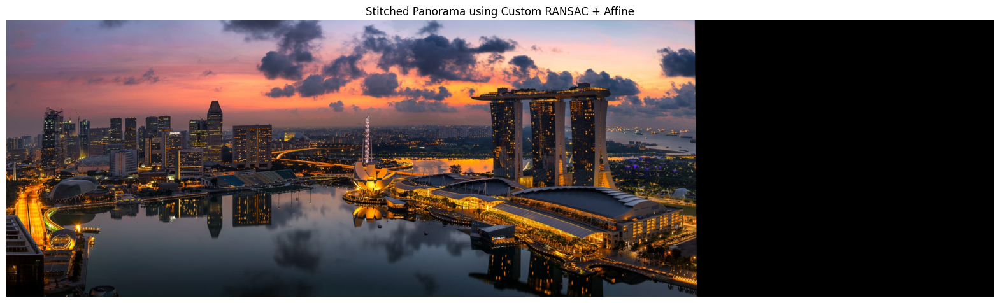

In [470]:
height, width = query_img.shape[:2]
warped_img2 = cv2.warpAffine(train_img, M_affine2, (width + train_img.shape[1], height))
warped_img2[0:height, 0:width] = query_img

plt.figure(figsize=(20, 8))
plt.imshow(warped_img2)
plt.axis('off')
plt.title("Stitched Panorama using Custom RANSAC + Affine")
plt.show()

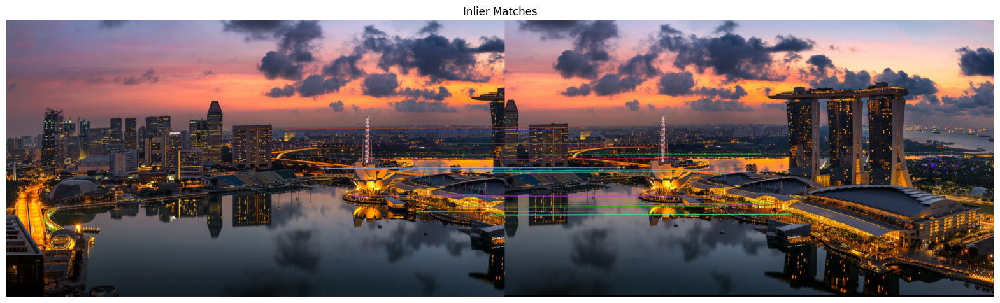

In [471]:
#  Inlier Matches 
inlier_vis2 = cv2.drawMatches(query_img, query_kp, train_img, train_kp, inlier_matches2, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(20, 8))
plt.imshow(inlier_vis2)
plt.axis('off')
plt.title("Inlier Matches")
plt.show()

In [472]:
iterations = [100, 300, 500, 1000, 1500]
for i in iterations:
    M_2, inliers_2, residuals_2 = custom_ransac_affine(matches2, query_kp, train_kp, threshold=3.0, iterations=i, seed=42)
    print(f"Iterations: {i}, Inliers: {len(inliers_2)}, Avg Residual: {np.mean(residuals_2):.2f}")




Iterations: 100, Inliers: 15, Avg Residual: 1.65
Iterations: 300, Inliers: 20, Avg Residual: 1.46
Iterations: 500, Inliers: 21, Avg Residual: 1.71
Iterations: 1000, Inliers: 21, Avg Residual: 1.71
Iterations: 1500, Inliers: 21, Avg Residual: 1.71


## Threshold of 0.7

In [473]:
#compute the euclidian distnce
matches3 = []
for i in query_sample_indices:
    dists = np.linalg.norm(normalized_train[train_sample_indices] - normalized_query[i], axis=1)
    best_j_local = np.argmin(dists)
    best_dist = dists[best_j_local]
    best_j = train_sample_indices[best_j_local]
    if best_dist < 0.7:  
        matches3.append(cv2.DMatch(_queryIdx=i, _trainIdx=best_j, _distance=best_dist))
    

In [474]:
matches3 = sorted(matches3, key=lambda x: x.distance)
print("total number of matches:", len(matches3))
matches3 = matches3[:100]
print("total number of matches:", len(matches3))

total number of matches: 349
total number of matches: 100


In [475]:
M_affine3, inlier_matches3,residuals3 = custom_ransac_affine(matches3, query_kp, train_kp,seed=42)
print("Inliers:", len(inlier_matches3))
print("Outliers:", len(matches3) - len(inlier_matches3))
avg_squared_residual3 = np.mean(np.square(residuals3))
rmse3 = np.sqrt(np.mean(np.square(residuals3)))
avg_residual3 = np.mean(residuals3)
print("Average residual:", avg_residual3)
print("RMSE:", rmse3)
print("Average squared residual:", avg_squared_residual3)
print("Best Affine Matrix (best_M):\n", M_affine3)


Inliers: 19
Outliers: 81
Average residual: 1.465595069445181
RMSE: 1.7542998154337146
Average squared residual: 3.0775678424307653
Best Affine Matrix (best_M):
 [[ 1.01034078e+00 -2.65356265e-02  6.04520030e+02]
 [ 3.52526439e-03  9.95085995e-01  3.84670441e+00]]


In [476]:
#  Accuracy Score (Euclidean Distance)

accuracy_score3 = compute_accuracy_score(inlier_matches3, query_kp, train_kp, M_affine3)
print(f"Accuracy Score (Avg Euclidean Distance): {accuracy_score3:.2f} pixels")

Accuracy Score (Avg Euclidean Distance): 1.47 pixels


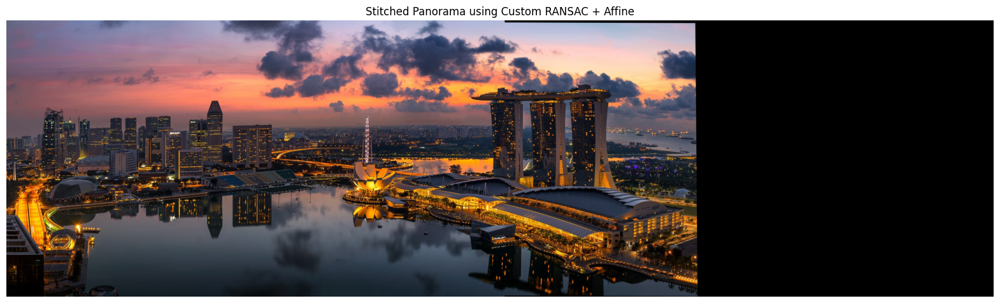

In [477]:
height, width = query_img.shape[:2]
warped_img3 = cv2.warpAffine(train_img, M_affine3, (width + train_img.shape[1], height))
warped_img3[0:height, 0:width] = query_img

plt.figure(figsize=(20, 8))
plt.imshow(warped_img)
plt.axis('off')
plt.title("Stitched Panorama using Custom RANSAC + Affine")
plt.show()

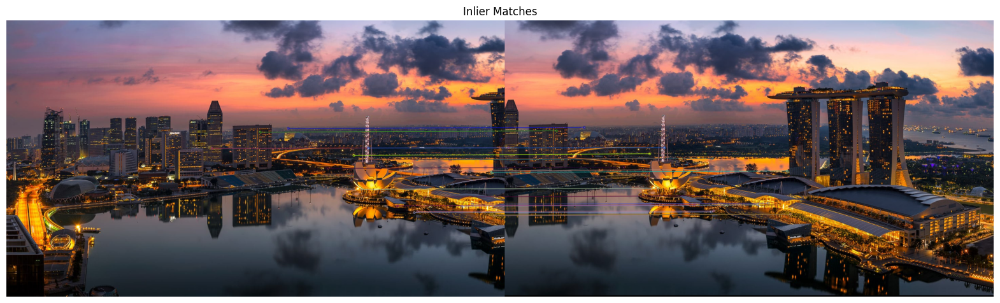

In [478]:
#  Inlier Matches plots
inlier_vis3 = cv2.drawMatches(query_img, query_kp, train_img, train_kp, inlier_matches3, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(20, 8))
plt.imshow(inlier_vis3)
plt.axis('off')
plt.title("Inlier Matches")
plt.show()

In [479]:
iterations = [100, 300, 500, 1000, 1500]
for i in iterations:
    M_3, inliers_3, residuals_3 = custom_ransac_affine(matches3, query_kp, train_kp, threshold=3.0, iterations=i, seed=42)
    print(f"Iterations: {i}, Inliers: {len(inliers_3)}, Avg Residual: {np.mean(residuals_3):.2f}")

Iterations: 100, Inliers: 11, Avg Residual: 1.37
Iterations: 300, Inliers: 19, Avg Residual: 1.47
Iterations: 500, Inliers: 19, Avg Residual: 1.47
Iterations: 1000, Inliers: 21, Avg Residual: 1.40
Iterations: 1500, Inliers: 21, Avg Residual: 1.40


## Homography initialization 

Transforming 2x3 matrix to 3x3 to use warptperspective and use homography for a proper stitch of the images even if the images are reversed 

In [480]:
def affine_to_homography(affine_matrix):
    """
    Converts a 2x3 affine matrix to a 3x3 homography matrix.
    """
    H = np.vstack([affine_matrix, [0, 0, 1]])
    return H


In [481]:
best_H = affine_to_homography(M_affine)
print("Homography Matrix (3x3):\n", best_H)


Homography Matrix (3x3):
 [[9.96488588e-01 8.54339102e-03 5.97108383e+02]
 [3.51141209e-03 9.91456609e-01 4.89161650e+00]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [482]:

h1, w1 = query_img.shape[:2]
h2, w2 = train_img.shape[:2]

# Corners of train_img which is the image being warped
train_corners = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
warped_corners = cv2.perspectiveTransform(train_corners, best_H)

# Also add corners of query_img which is the reference image
query_corners = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)

# Combining all corners to find final panorama bounds
all_corners = np.concatenate((warped_corners, query_corners), axis=0)
[x_min, y_min] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
[x_max, y_max] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

#  keeping  everything in positive space
translation = [-x_min, -y_min]
H_translation = np.array([
    [1, 0, translation[0]],
    [0, 1, translation[1]],
    [0, 0, 1]
])

# Warp train_img with updated homography
panorama_size = (x_max - x_min, y_max - y_min)
warped_img = cv2.warpPerspective(train_img, H_translation @ best_H, panorama_size)

warped_img[translation[1]:translation[1]+h1, translation[0]:translation[0]+w1] = query_img


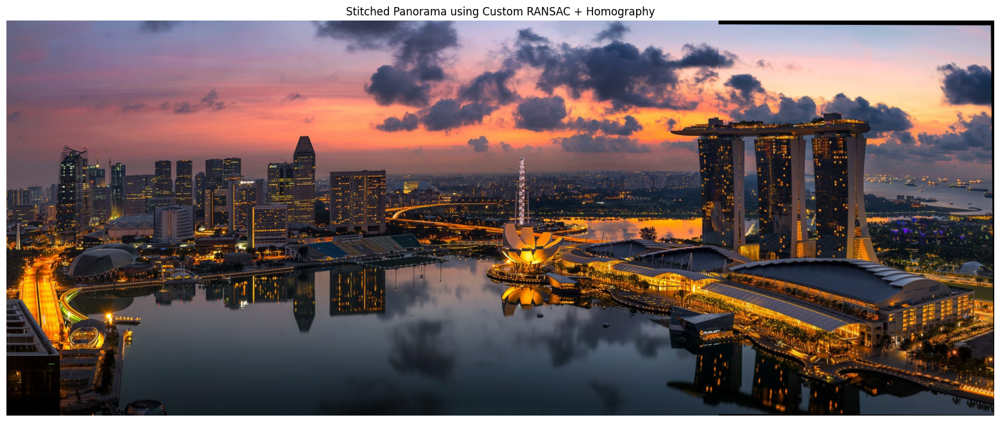

In [483]:
plt.figure(figsize=(20, 8))
plt.imshow(warped_img)
plt.axis('off')
plt.title("Stitched Panorama using Custom RANSAC + Homography")
plt.show()
